In [2]:
using ITensors, ITensorMPS
using SparseArrays
using LinearAlgebra
using Plots
using JLD2
using LaTeXStrings
using Glob
using StatsBase

In [3]:
using JLD2
using Glob

"""
Load sample_*.jld2 files from `outdir` and combine data across
samples and repeated jobs.

Files missing required keys (including "mode") are skipped.

Returns:
  combined :: Dict{NamedTuple, Dict{Symbol, Any}}
  skipped  :: Vector{String}
"""
function load_and_combine(outdir::String)
    files = vcat(
    glob("sample_*20251231*.jld2", outdir),
    glob("sample_*202601*.jld2", outdir),
)

    # files = glob("sample_*.jld2", outdir)

    combined = Dict{NamedTuple, Dict{Symbol, Any}}()
    skipped  = String[]

    for f in files
        d = load(f)

        # hard requirements
        if !(haskey(d, "L") &&
             haskey(d, "T") &&
             haskey(d, "p") &&
             haskey(d, "mode") &&
             haskey(d, "data"))
            push!(skipped, f)
            continue
        end

        # optional but expected
        t = get(d, "t", 1)

        key = (
            L    = d["L"],
            T    = d["T"],
            p    = d["p"],
            mode = d["mode"],
            t    = t,
        )

        data = d["data"]  # Dict or NamedTuple

        if !haskey(combined, key)
            combined[key] = Dict(
                obs => deepcopy(val) for (obs, val) in pairs(data)
            )
        else
            for (obs, val) in pairs(data)
                old = combined[key][obs]

                if isa(old, AbstractArray) && isa(val, AbstractArray)
                    combined[key][obs] = vcat(old, val)
                else
                    error("Cannot combine observable $obs in file $f")
                end
            end
        end
    end

    return combined, skipped
end

# Example usage
outdir = joinpath(@__DIR__, "../output")
combined, skipped = load_and_combine(outdir)

@show length(skipped)


length(skipped) = 0


0

In [379]:
combined[(L=1024, T=10240, p=0.1, mode="renyi2", t=1)][:κ2_corrs][:,2]

2050-element Vector{Float64}:
  0.0
  4.904046756829461e-35
 -1.595560643686301e-29
 -3.5085990951775584e-29
 -5.029205584523109e-29
 -7.101980432646546e-29
 -2.866467972647865e-28
  2.342749198674916e-29
  8.435761669963495e-26
  6.043190048973798e-23
  ⋮
  0.18145921409516325
  0.1815388545231966
  0.18161832144308734
  0.181697652664277
  0.18177683736272066
  0.18185585287023173
  0.18193472347762943
  0.18201345122845558
  0.18209203767885693

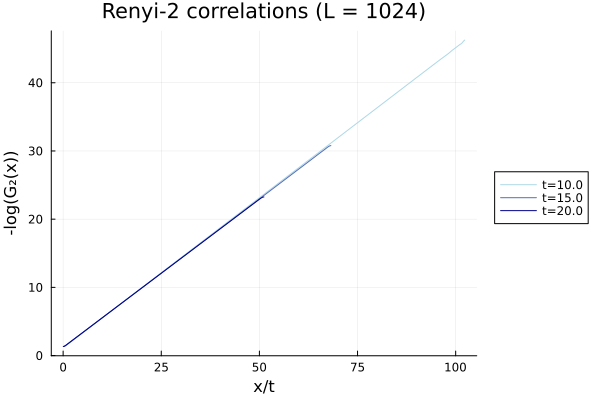

In [374]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 1024
T = 10L

ts = 100:50:200

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= p*t
    ys = -log.(ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i])# xlim=(-0.1,20), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/t", ylabel="-log(G₂(x))", title="Renyi-2 correlations (L = 1024)")
# savefig(plt, "../figs/26_01_04/renyi2_correlations_L1024.pdf")

plt

In [30]:
[key for key in keys(combined) if key.mode == "renyi1_TCI" && key.p == 0.1 && key.L == 128]

23-element Vector{@NamedTuple{L::Int64, T::Int64, p::Float64, mode::String, t::Int64}}:
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 88)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 64)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 768)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 512)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 896)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 80)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 96)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 256)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 40)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 32)
 ⋮
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 24)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 72)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 640)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 56)
 (L = 128, T = 1280, p = 0.1, mode = "renyi1_TCI", t = 8)
 (L = 128, T = 1280,

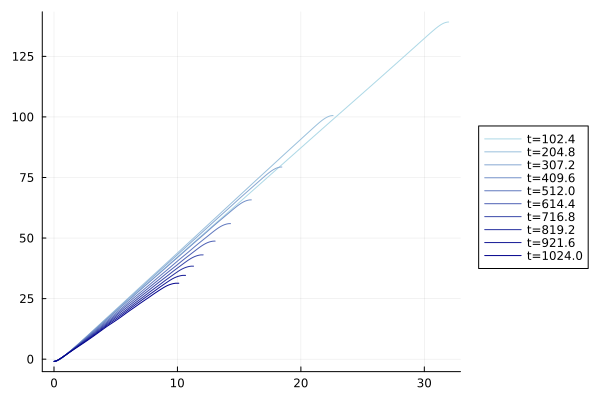

In [132]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 1024
T = 10L

ts = union(L:L:10L)

α = 0.01
β = -0.99

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    ys = -t*log.(ys) .- t*1.388

    xs /= sqrt(t)
    ys /= sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i])#, xlim=(-0.1,5), ylim=(-5,20))#, xscale=:log10, yscale=:log10)
end
plt

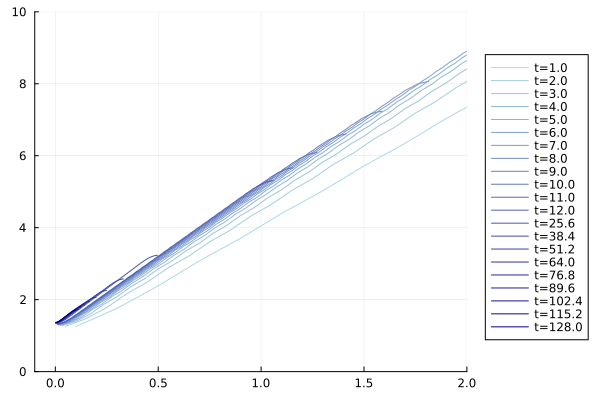

In [140]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

α = 0.01
β = -0.99

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= t
    ys = -log.(ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i], xlim=(-0.1,2), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plt

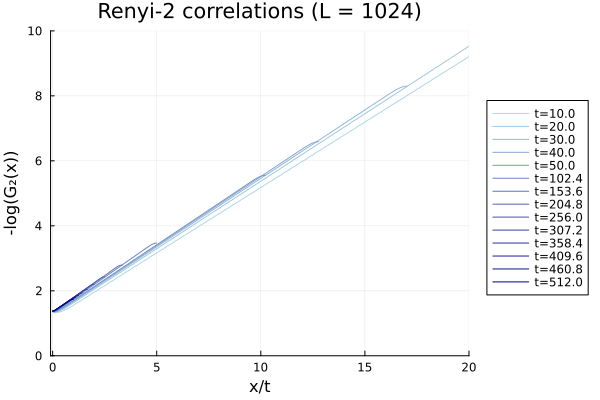

In [45]:
which_ind(t) = t÷10 + 1
p = 0.1
L = 512
T = 10L
ts = union(100:100:L, 2L:L:10L)
colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )
    xs /= p*t
    ys = -log.(ys)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i], xlim=(-0.1,20), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/t", ylabel="-log(G₂(x))", title="Renyi-2 correlations (L = 1024)")
# savefig(plt, "../figs/26_01_04/renyi2_correlations_L1024.pdf")

plt

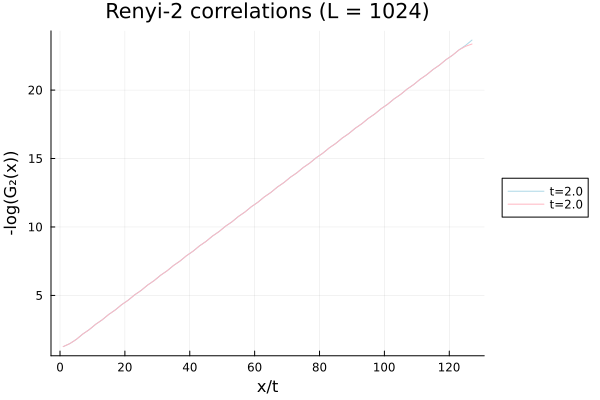

In [35]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 512
T = 10L

ts = [20]

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs = xs[1:64]
    ys = ys[1:64]

    # xs /= p*t
    ys = -log.(ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:64], ys[1:64], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i])#, xlim=(-0.1,20), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/t", ylabel="-log(G₂(x))", title="Renyi-2 correlations (L = 1024)")

L = 128
T = 10L

# ts = [100]

colors = palette(:reds, length(ts))
# plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    # xs /= p*t
    ys = -log.(ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i])#, xlim=(-0.1,20), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/t", ylabel="-log(G₂(x))", title="Renyi-2 correlations (L = 1024)")

# savefig(plt, "../figs/26_01_04/renyi2_correlations_L1024.pdf")

plt

In [31]:
L = 128
T = 10L
p = 0.1
ind = 10
reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

64-element Vector{Float64}:
 0.26830033124050645
 0.2611167000978702
 0.2495954491696475
 0.23095390872269497
 0.21480716192368154
 0.19504655613714714
 0.1802140421791524
 0.16317963609578176
 0.15072206254395712
 0.1365136537254295
 ⋮
 0.002282189597261809
 0.002108338110529068
 0.0019124988329001038
 0.001774062318284206
 0.0016263962434866473
 0.0015303038543696946
 0.001439596695174841
 0.0013913193609434921
 0.0013610936443682667

In [33]:
L = 512
T = 10L
p = 0.1
ind = 10
reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

256-element Vector{Float64}:
 0.26830033124025404
 0.26111670009651133
 0.24959544917634469
 0.23095390873136135
 0.21480716194406677
 0.1950465561610208
 0.18021404221127266
 0.1631796361369446
 0.15072206258906426
 0.13651365378141445
 ⋮
 8.817933560516024e-11
 8.146198979542035e-11
 7.389519215306667e-11
 6.854637171467184e-11
 6.284098208053105e-11
 5.912825854246605e-11
 5.562360083903326e-11
 5.3758303996857696e-11
 5.259046795951681e-11

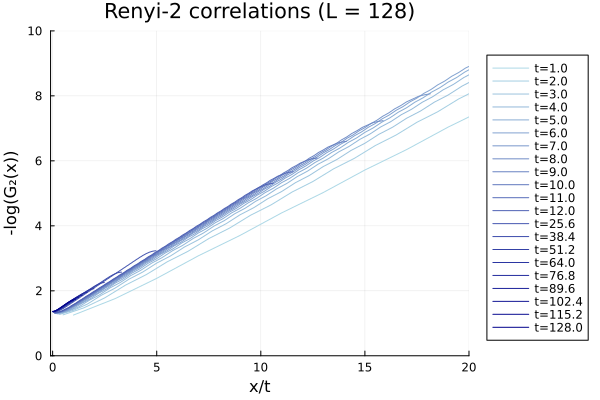

In [383]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= p*t
    ys = -log.( ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i], xlim=(-0.1,20), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/t", ylabel="-log(G₂(x))", title="Renyi-2 correlations (L = 128)")
# savefig(plt, "../figs/26_01_04/renyi2_correlations_L128.pdf")

plt

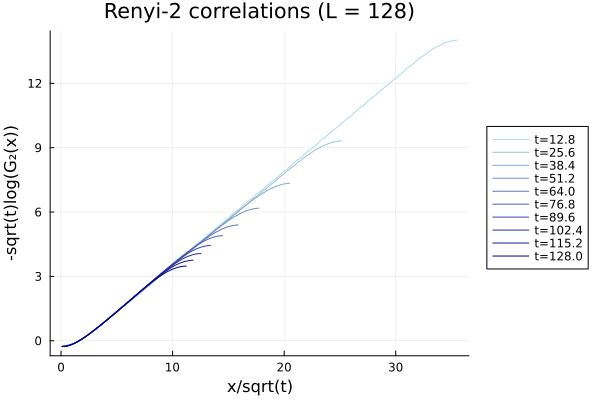

In [322]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= (p*t)^0.5
    ys = -(p*t)^0.5*log.(exp(1.39)* ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i])#, xlim=(-0.1,30), ylim=(-2,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/sqrt(t)", ylabel="-sqrt(t)log(G₂(x))", title="Renyi-2 correlations (L = 128)")
savefig(plt, "../figs/26_01_04/renyi2_correlations_L128_rescaled2.pdf")

plt

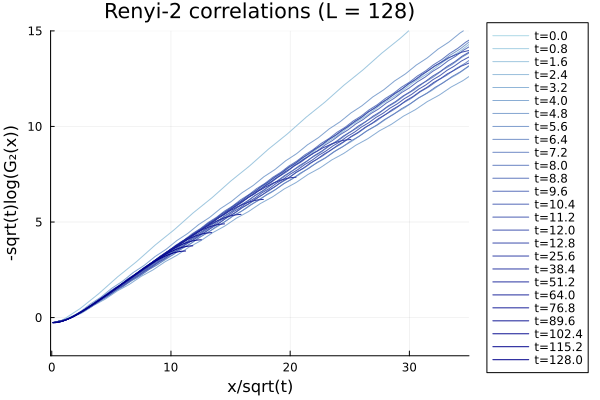

In [323]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(0:8:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= (p*t)^0.5
    ys = -(p*t)^0.5*log.(exp(1.39)* ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i], xlim=(-0.1,35), ylim=(-2,15))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/sqrt(t)", ylabel="-sqrt(t)log(G₂(x))", title="Renyi-2 correlations (L = 128)")
savefig(plt, "../figs/26_01_04/renyi2_correlations_L128_rescaled3.pdf")

plt

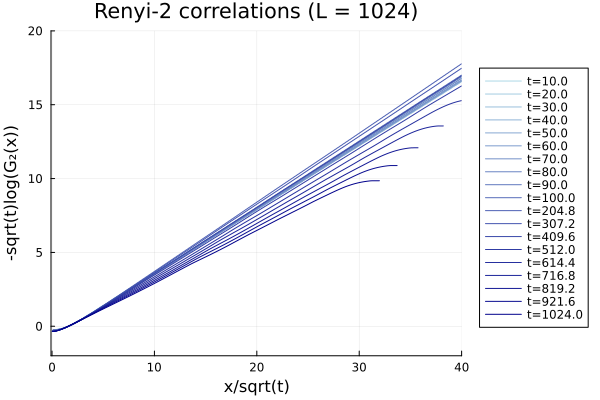

In [324]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 1024
T = 10L

ts = union(100:100:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= (p*t)^0.5
    ys = -(p*t)^0.5*log.(exp(1.39)* ys)

    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i], xlim=(-0.1,40), ylim=(-2,20))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/sqrt(t)", ylabel="-sqrt(t)log(G₂(x))", title="Renyi-2 correlations (L = 1024)")
savefig(plt, "../figs/26_01_04/renyi2_correlations_L1024_rescaled2.pdf")

plt

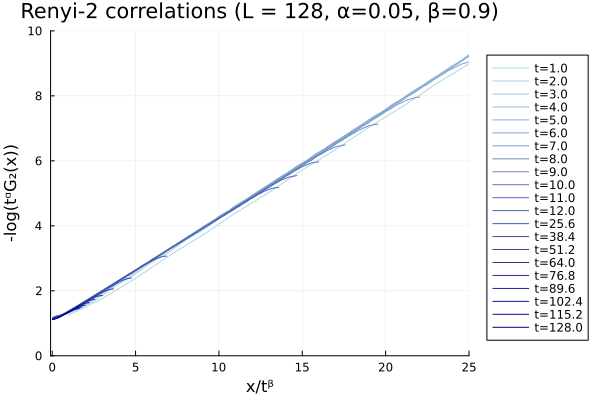

In [325]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= (p*t)^0.9
    ys = -log.((p*t)^0.05 * ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i], xlim=(-0.1,25), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/tᵝ", ylabel="-log(tᵅG₂(x))", title="Renyi-2 correlations (L = 128, α=0.05, β=0.9)")
savefig(plt, "../figs/26_01_04/renyi2_correlations_L128_rescaled.pdf")

plt

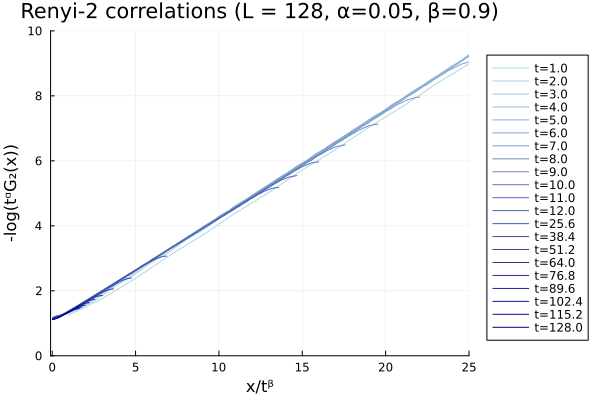

In [384]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

α = 0.05
β = 0.9

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= (p*t)^β
    ys = -log.((p*t)^α * ys)

    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i], xlim=(-0.1,25), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/tᵝ", ylabel="-log(tᵅG₂(x))", title="Renyi-2 correlations (L = 128, α=0.05, β=0.9)")
# savefig(plt, "../figs/26_01_04/renyi2_correlations_L128_rescaled.pdf")

plt


SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; giving up

SYSTEM: caught exception of type :MethodError while trying to print a failed Task notice; 

Linear fit: y = 1.5138832584030308 + 0.33173954041547987*x
R² = 0.996256423099157


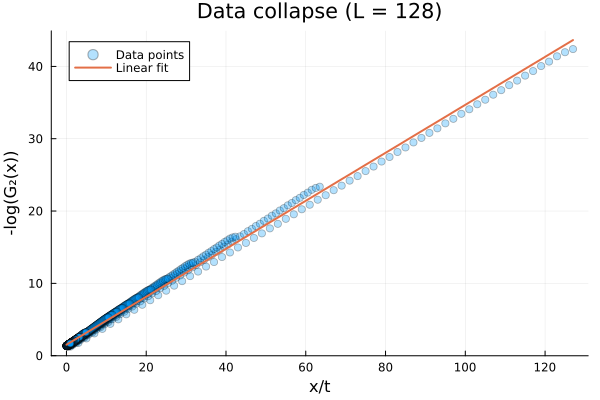

In [386]:
# Fit scaling exponents α and β to collapse data
using LsqFit

which_ind(t) = t÷10 + 1

p = 0.1
L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

# Collect all data points
all_xs = Float64[]
all_ys = Float64[]

for t in ts
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
    
    xs_scaled = xs ./ (p*t)
    ys_scaled = -log.(ys)
    
    append!(all_xs, xs_scaled)
    append!(all_ys, ys_scaled)
end

# Fit a simple linear model: y = a + b*x
model(x, p) = p[1] .+ p[2] .* x
p0 = [1.0, -0.1]
fit = curve_fit(model, all_xs, all_ys, p0)

println("Linear fit: y = $(fit.param[1]) + $(fit.param[2])*x")
println("R² = $(1 - sum((all_ys .- model(all_xs, fit.param)).^2) / sum((all_ys .- mean(all_ys)).^2))")

# Plot collapsed data
plt = plot(xlabel="x/t", ylabel="-log(G₂(x))", title="Data collapse (L = 128)")
scatter!(plt, all_xs, all_ys, alpha=0.3, label="Data points")
plot!(plt, all_xs, model(all_xs, fit.param), label="Linear fit", linewidth=2)
plt

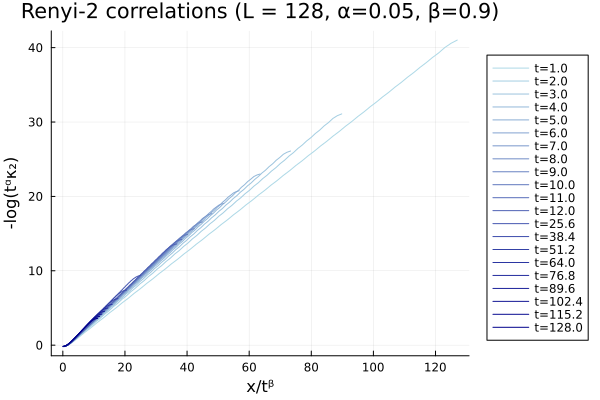

In [ ]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= (p*t)^0.5
    ys = -(p*t)^0.5*log.(exp(1.38)*ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i])#, xlim=(-0.1,25), ylim=(-2,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/tᵝ", ylabel="-log(tᵅκ₂)", title="Renyi-2 correlations (L = 128, α=0.05, β=0.9)")
# savefig(plt, "../figs/26_01_04/renyi2_correlations_L128_rescaled.pdf")

plt

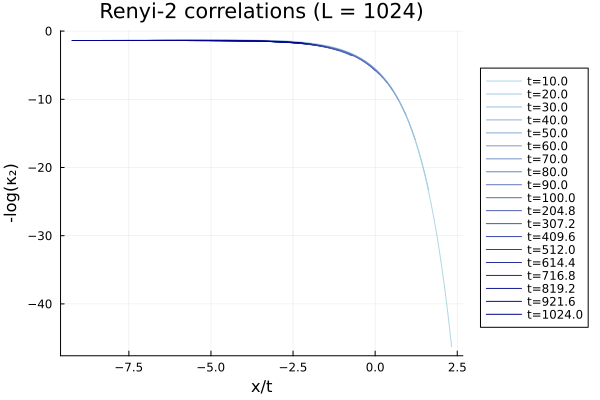

In [319]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 1024
T = 10L

ts = union(100:100:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs = log.(xs/t)
    ys = log.(ys)
    # xs /= p*t
    # ys = -log.(ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i])#, xlim=(-0.1,20), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plot!(plt, xlabel="x/t", ylabel="-log(κ₂)", title="Renyi-2 correlations (L = 1024)")
# savefig(plt, "../figs/26_01_04/renyi2_correlations_L1024.pdf")

plt

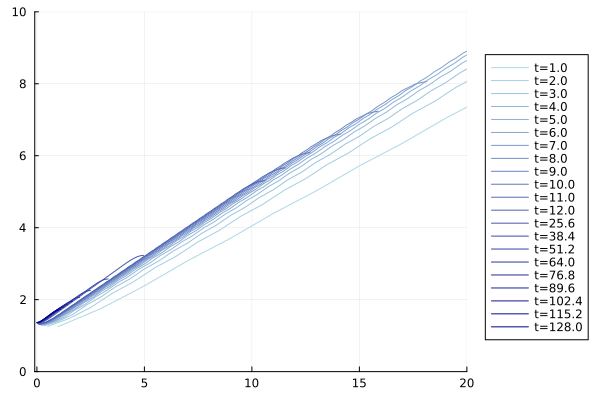

In [175]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= p*t
    ys = -log.(ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i], xlim=(-0.1,20), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plt

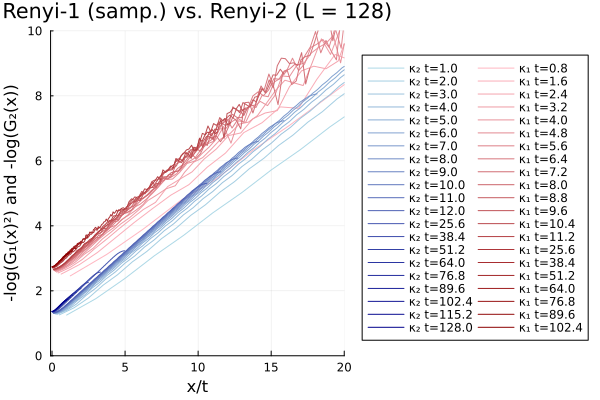

In [326]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot(legend=:outerright, legend_columns=2)
# Interleave blues and reds for proper column grouping
ts_blue = union(10:10:L, 2L:L:10L)
ts_red = union(8:8:L-16, 2L:L:8L)

colors_blue = palette(:blues, length(ts_blue))
colors_red = palette(:reds, length(ts_red))

max_len = max(length(ts_blue), length(ts_red))

for i in 1:max_len
    # Add blue entry (left column)
    if i <= length(ts_blue)
        t = ts_blue[i]
        ind = which_ind(t)
        xs = 1:2:L
        ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
        xs /= p*t
        ys = -log.(ys)
        plot!(plt, xs[1:end], ys[1:end], label="κ₂ t=$(round(p*t,digits=2))", color=colors_blue[i], xlim=(-0.1,20), ylim=(0,10))
    end
    
    # Add red entry (right column)
    if i <= length(ts_red)
        t = ts_red[i]
        ind = which_ind(t)
        xs = 1:2:L
        ys = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_sampled", t=t)][:κ1_corrs_sampled], dims=1)[1,:]) .^ 2
        xs /= p*t
        ys = -log.(ys)
        plot!(plt, xs[1:end], ys[1:end], label="κ₁ t=$(round(p*t,digits=2))", color=colors_red[i], xlim=(-0.1,20), ylim=(0,10))
    end
end

plot!(plt, xlabel="x/t", ylabel="-log(G₁(x)²) and -log(G₂(x))", title="Renyi-1 (samp.) vs. Renyi-2 (L = 128)")

savefig(plt, "../figs/26_01_04/renyi1_sampled_vs_renyi2_L128.pdf")

plt


In [ ]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L


plt = plot()

# Interleave blues and reds for proper column grouping
ts_blue = [40, 80, 120]
ts_red = [40, 80, 120]

colors_blue = palette(:blues, length(ts_blue))
colors_red = palette(:reds, length(ts_red))

plot!(plt, [], [], label=L"\textrm{Renyi})



for i in 1:max_len
    # Add blue entry (left column)
    if i <= length(ts_blue)
        t = ts_blue[i]
        ind = which_ind(t)
        xs = 1:2:L
        ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
        xs /= p*t
        ys = -log.(ys)
        plot!(plt, xs[1:end], ys[1:end], label="κ₂ t=$(round(p*t,digits=2))", color=colors_blue[i], xlim=(-0.1,20), ylim=(0,10))
    end
    
    # Add red entry (right column)
    if i <= length(ts_red)
        t = ts_red[i]
        ind = which_ind(t)
        xs = 1:2:L
        ys = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI], dims=1)[1,:]) .^ 2
        xs /= p*t
        ys = -log.(ys)
        plot!(plt, xs[1:end], ys[1:end], label="κ₁ t=$(round(p*t,digits=2))", color=colors_red[i], xlim=(-0.1,20), ylim=(0,10))
    end
end

plot!(plt, xlabel="x/t", ylabel="-log(G₁(x)²) and -log(G₂(x))", title="Renyi-1 (TCI) vs. Renyi-2 (L = 128)")

# savefig(plt, "../figs/26_01_04/renyi1_TCI_vs_renyi2_L128.pdf")

plt


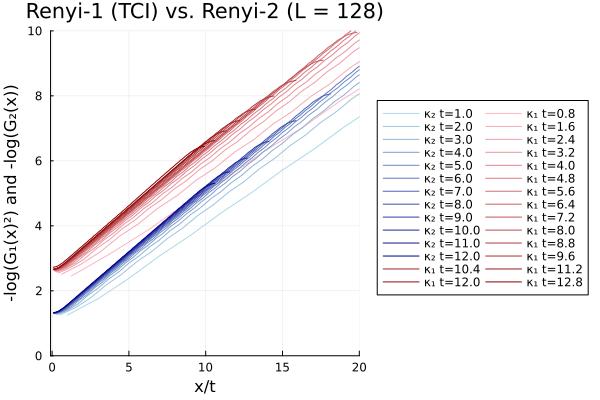

In [ ]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot(legend=:outerright, legend_columns=2)
# Interleave blues and reds for proper column grouping
ts_blue = union(10:10:L)#, 2L:L:10L)
ts_red = union(8:8:L)#, 2L:L:8L)

colors_blue = palette(:blues, length(ts_blue))
colors_red = palette(:reds, length(ts_red))

max_len = max(length(ts_blue), length(ts_red))

for i in 1:max_len
    # Add blue entry (left column)
    if i <= length(ts_blue)
        t = ts_blue[i]
        ind = which_ind(t)
        xs = 1:2:L
        ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
        xs /= p*t
        ys = -log.(ys)
        plot!(plt, xs[1:end], ys[1:end], label="κ₂ t=$(round(p*t,digits=2))", color=colors_blue[i], xlim=(-0.1,20), ylim=(0,10))
    end
    
    # Add red entry (right column)
    if i <= length(ts_red)
        t = ts_red[i]
        ind = which_ind(t)
        xs = 1:2:L
        ys = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI], dims=1)[1,:]) .^ 2
        xs /= p*t
        ys = -log.(ys)
        plot!(plt, xs[1:end], ys[1:end], label="κ₁ t=$(round(p*t,digits=2))", color=colors_red[i], xlim=(-0.1,20), ylim=(0,10))
    end
end

plot!(plt, xlabel="x/t", ylabel="-log(G₁(x)²) and -log(G₂(x))", title="Renyi-1 (TCI) vs. Renyi-2 (L = 128)")

# savefig(plt, "../figs/26_01_04/renyi1_TCI_vs_renyi2_L128.pdf")

plt


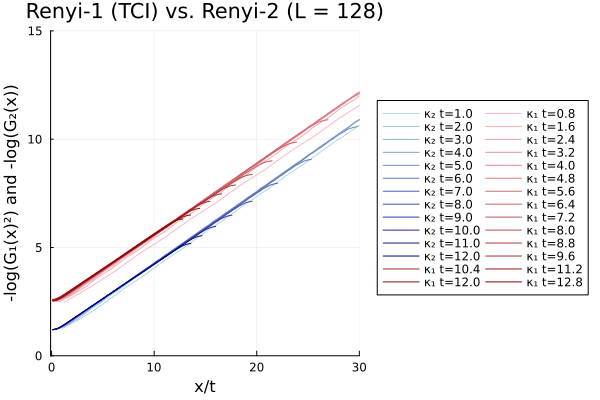

In [388]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot(legend=:outerright, legend_columns=2)
# Interleave blues and reds for proper column grouping
ts_blue = union(10:10:L)#, 2L:L:10L)
ts_red = union(8:8:L)#, 2L:L:8L)

colors_blue = palette(:blues, length(ts_blue))
colors_red = palette(:reds, length(ts_red))

max_len = max(length(ts_blue), length(ts_red))

α = 0.05

β = 0.9
for i in 1:max_len
    # Add blue entry (left column)
    if i <= length(ts_blue)
        t = ts_blue[i]
        ind = which_ind(t)
        xs = 1:2:L
        ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :])
        xs /= (p*t)^β
        ys = -log.((p*t)^α .* ys)
        plot!(plt, xs[1:end], ys[1:end], label="κ₂ t=$(round(p*t,digits=2))", color=colors_blue[i], xlim=(-0.1,30), ylim=(0,15))
    end
    
    # Add red entry (right column)
    if i <= length(ts_red)
        t = ts_red[i]
        ind = which_ind(t)
        xs = 1:2:L
        ys = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI], dims=1)[1,:]) .^ 2
        xs /= (p*t)^β
        ys = -log.((p*t)^α .* ys)
        plot!(plt, xs[1:end], ys[1:end], label="κ₁ t=$(round(p*t,digits=2))", color=colors_red[i], xlim=(-0.1,30), ylim=(0,15))
    end
end

plot!(plt, xlabel="x/t", ylabel="-log(G₁(x)²) and -log(G₂(x))", title="Renyi-1 (TCI) vs. Renyi-2 (L = 128)")

# savefig(plt, "../figs/26_01_04/renyi1_TCI_vs_renyi2_L128.pdf")

plt


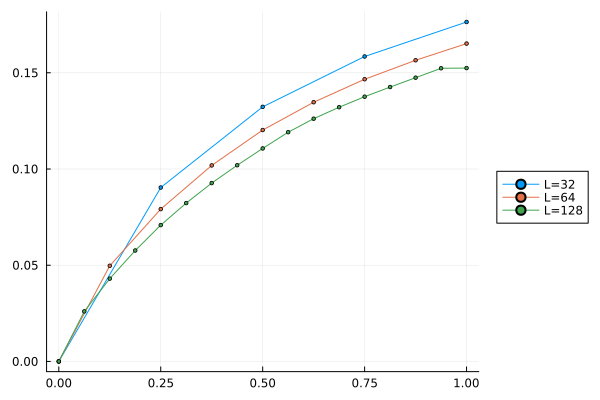

In [350]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128



colors = palette(:blues, length(ts))
plt = plot()
for L in [32, 64, 128]
    T = 10L
    ts = union(0:8:L)#, 2L:L:7L)
    # ind = which_ind(t)
    xs = ts
    ys = [reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_TCI], dims=1)[1,:])[1] for t in ts]

    # xs /= p*t
    # ys = -log.(ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end]/L, ys[1:end]/L, label="L=$L",legend=:outerright, m=2)#, xlim=(-0.1,20), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plt

In [345]:
xs

17-element Vector{Int64}:
  1
  1
  2
  3
  4
  5
  5
  6
  7
  8
  9
  9
 10
 11
 12
 13
 13

In [347]:
[reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_TCI], dims=1)[1,:])[1] for t in ts]

17-element Vector{Float64}:
  0.0
  3.3273376911432155
  5.508879812069786
  7.378554559887232
  9.06830843044882
 10.534327487696224
 11.863560353801018
 13.050398032842683
 14.16801406675416
 15.248955799254484
 16.14677551445213
 16.910783831045244
 17.61110880507846
 18.252521040990704
 18.875884807628168
 19.501189726593793
 19.513162502623373

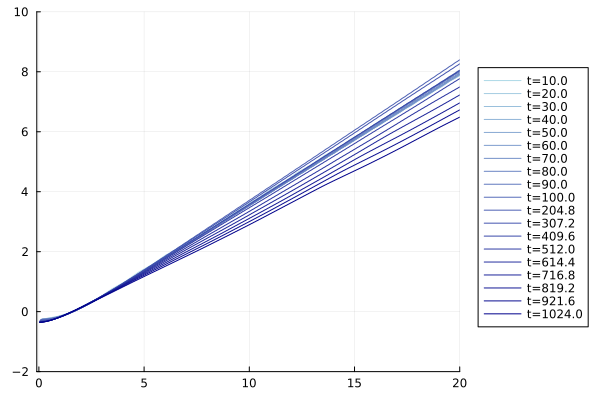

In [174]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 1024
T = 10L

ts = union(100:100:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= p*t
    ys = -log.(ys)

    xs *= sqrt(p*t)
    ys .-= 1.39
    ys *= sqrt(p*t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i], xlim=(-0.1,20), ylim=(-2,10))#, xscale=:log10, yscale=:log10)
end
plt

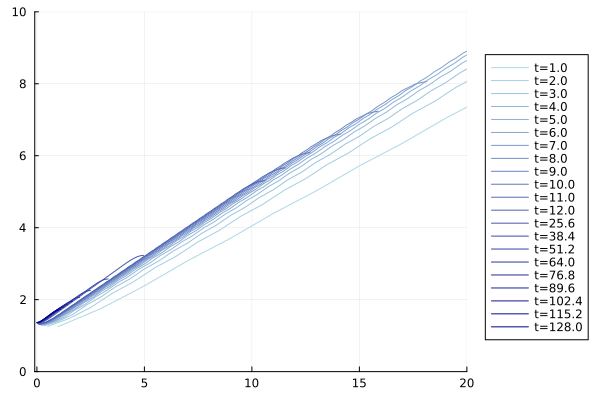

In [147]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(10:10:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= p*t
    ys = -log.(ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i], xlim=(-0.1,20), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plt

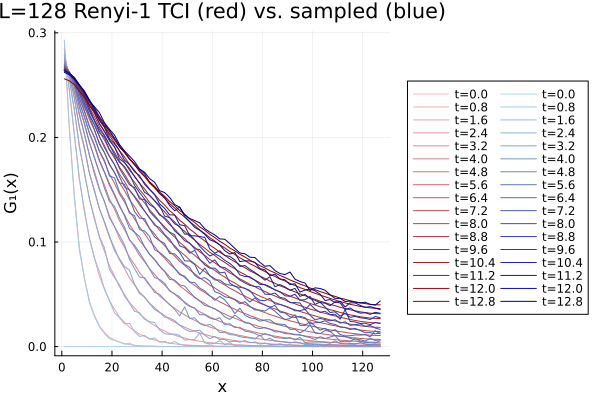

In [328]:
# which_ind(t) = t==0 ?# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(100:100:L, 2L:L:10L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= p*t
    ys = -log.(ys)

    # xs /= sqrt(t)
    # ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(round(p*t,digits=2))",legend=:outerright,color=colors[i], xlim=(-0.1,20), ylim=(0,10))#, xscale=:log10, yscale=:log10)
end
plt
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(0:8:L)

colors = palette(:reds, length(ts))
plt = plot(legend=:outerright, legend_columns=2)
colors_tci   = palette(:reds, length(ts))
colors_smpl  = palette(:blues, length(ts))

for (i, t) in enumerate(ts)
    ind = which_ind(t)

    xs = collect(1:2:L)
    ys_tci = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI], dims=1)[1, :])
    plot!(plt, xs, ys_tci, label="t=$(round(t*0.1,digits=2))", color=colors_tci[i])

    ys_smpl = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_sampled", t=t)][:κ1_corrs_sampled], dims=1)[1, :])
    plot!(plt, xs, ys_smpl, label="t=$(round(t*0.1,digits=2))", color=colors_smpl[i])
end

plot!(plt, title="L=128 Renyi-1 TCI (red) vs. sampled (blue)", xlabel="x", ylabel="G₁(x)")

savefig(plt, "../figs/26_01_04/renyi1_TCI_vs_sampled_L128.pdf")
plt


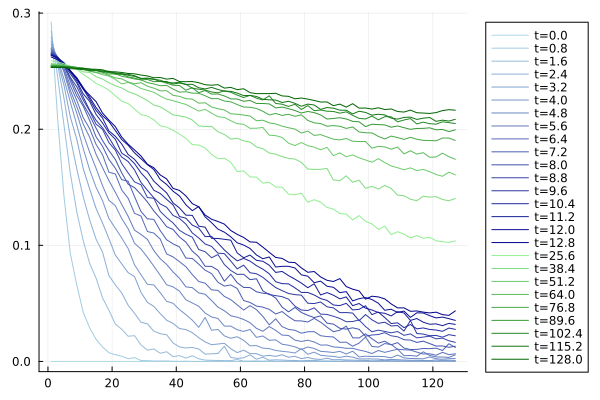

In [46]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(0:8:L)

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = collect(1:2:L)
    # xs /= sqrt(t)
    ys = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_sampled", t=t)][:κ1_corrs_sampled], dims=1)[1,:])
    # ys = -t*log.(exp(1.35)*ys)
    plot!(plt, xs, ys, label="t=$(round(t*0.1,digits=2))",legend=:outerright,color=colors[i])#, xlims=(0,20), ylims=(-2,80))
end

ts = union(2L:L:10L)

colors = palette(:greens, length(ts))
# plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = collect(1:2:L)
    # xs /= sqrt(t)
    ys = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_sampled", t=t)][:κ1_corrs_sampled], dims=1)[1,:])
    # ys = -t*log.(exp(1.35)*ys)
    plot!(plt, xs, ys, label="t=$(round(t*0.1,digits=2))",legend=:outerright,color=colors[i])#, xlims=(0,20), ylims=(-2,80))
end

plt

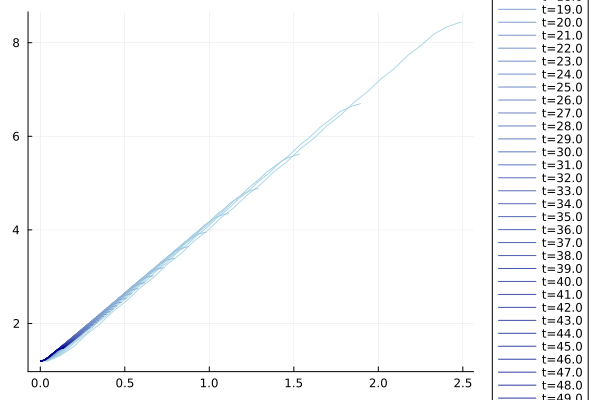

In [176]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 64
T = 10L

ts = 30:10:10L

α = 1-0.05

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= t^α
    ys = -log.(ys*t^((1-α)/2))
    plot!(plt, xs[1:end], ys[1:end], label="t=$(p*t)",legend=:outerright,color=colors[i])#, xscale=:log10, yscale=:log10)
end
plt

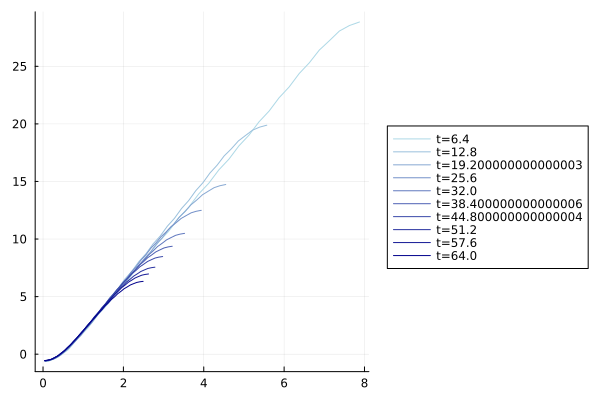

In [179]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 64
T = 10L

ts = L:L:10L

α = 1-0.13

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= sqrt(t)
    ys = -log.(ys*exp(1.38))*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$(p*t)",legend=:outerright,color=colors[i])#, xscale=:log10, yscale=:log10)
end
plt

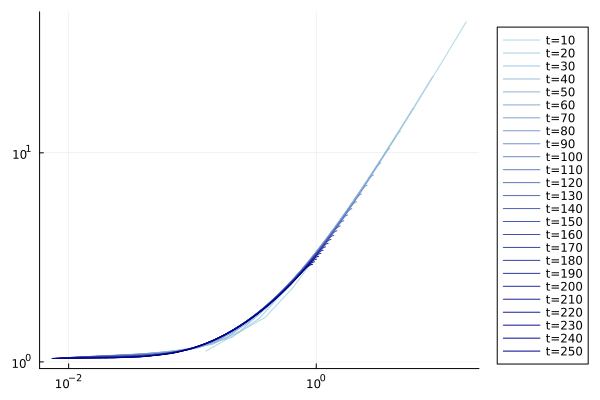

In [144]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = 10:10:2L

α = 1-0.11

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= t^α
    ys = -log.(ys*t^((1-α)/2))
    plot!(plt, xs[1:end], ys[1:end], label="t=$t",legend=:outerright,color=colors[i], xscale=:log10, yscale=:log10)
end
plt

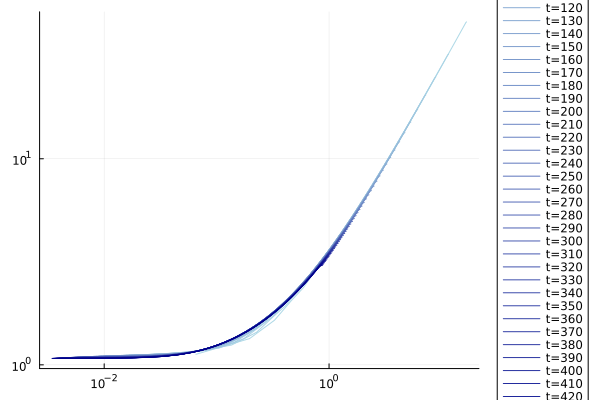

In [154]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 256
T = 10L

ts = 20:10:2L

α = 1-0.09

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= t^α
    ys = -log.(ys*t^((1-α)/2))
    plot!(plt, xs[1:end], ys[1:end], label="t=$t",legend=:outerright,color=colors[i], xscale=:log10, yscale=:log10)
end
plt

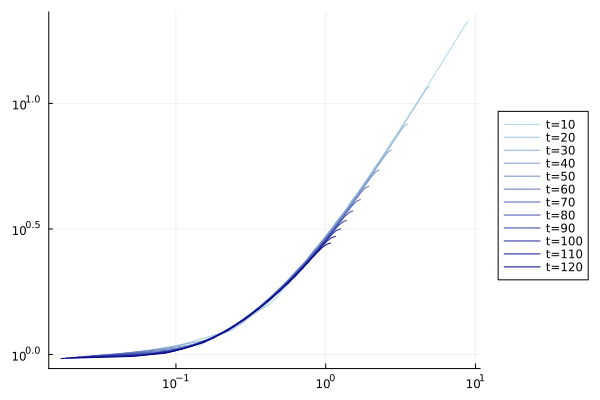

In [138]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 64
T = 10L

ts = 10:10:2L

α = 1-0.15

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= t^α
    ys = -log.(ys*t^((1-α)/2))
    plot!(plt, xs[1:end], ys[1:end], label="t=$t",legend=:outerright,color=colors[i], xscale=:log10, yscale=:log10)
end
plt

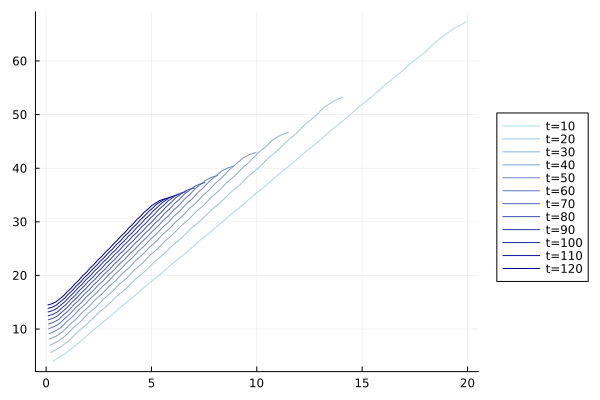

In [ ]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 64
T = 10L

ts = 10:10:2L

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )

    xs /= sqrt(t)
    ys = -log.(ys)*sqrt(t)
    plot!(plt, xs[1:end], ys[1:end], label="t=$t",legend=:outerright,color=colors[i])
end
plt

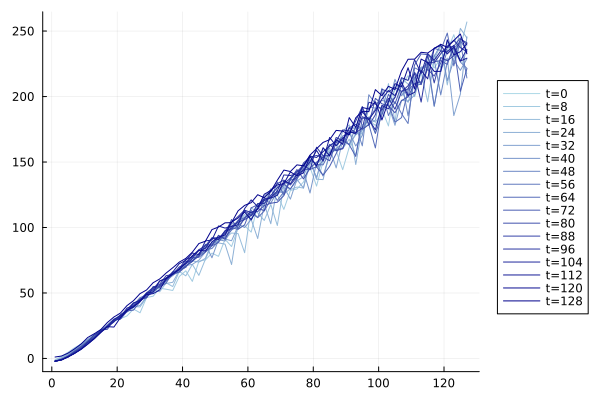

In [53]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = 0:8:L

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = collect(1:2:L)
    # xs /= sqrt(t)
    ys = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_sampled", t=t)][:κ1_corrs_sampled], dims=1)[1,:])
    ys = -t*log.(exp(1.35)*ys)
    plot!(plt, xs, ys, label="t=$t",legend=:outerright,color=colors[i])#, xlims=(0,20), ylims=(-2,80))
end
plt

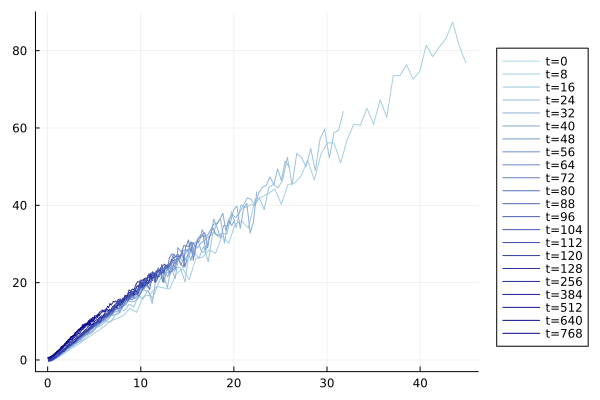

In [54]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 128
T = 10L

ts = union(0:8:L, [2L], [3L], [4L], [5L], [6L])

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = collect(1:2:L)
    xs /= sqrt(t)
    ys = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_sampled", t=t)][:κ1_corrs_sampled], dims=1)[1,:])
    ys = -sqrt(t)*log.(exp(1.35)*ys)
    plot!(plt, xs, ys, label="t=$t",legend=:outerright,color=colors[i])#, xlims=(0,20), ylims=(-2,80))
end

plt

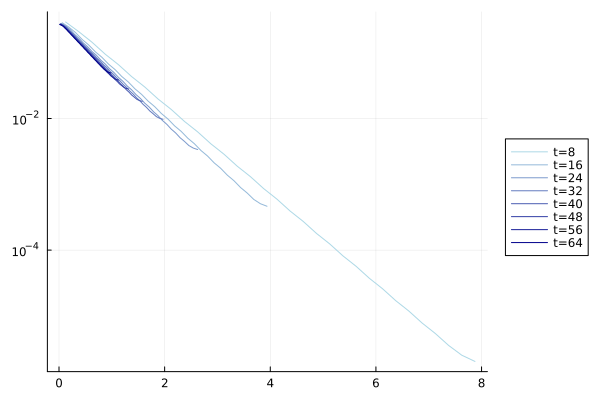

In [95]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 64
T = 10L

ts = union(8:8:L)#, [2L], [3L], [4L], [5L], [6L])

colors = palette(:blues, length(ts))
plt = plot()

α = 0.0
β = -1.0

for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = collect(1:2:L)
    ys = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI], dims=1)[1,:])

    xs = xs * t^β
    ys = ys * t^α
    # ys = -t*log.(exp(1.35)*ys)
    plot!(plt, xs, ys, label="t=$t",legend=:outerright,color=colors[i], yscale=:log10)#, xlims=(0,20), ylims=(-2,80))
end

plt

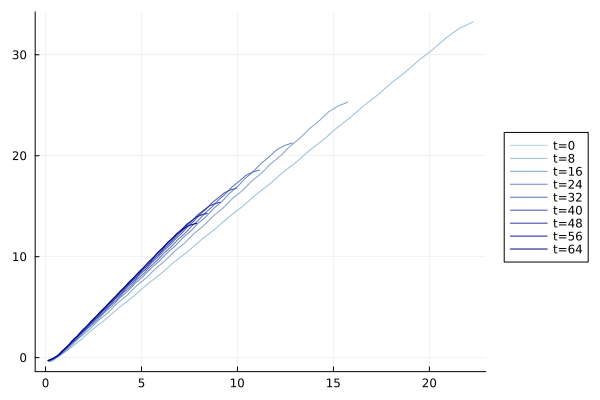

In [63]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 64
T = 10L

ts = union(0:8:L)#, [2L], [3L], [4L], [5L], [6L])

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = collect(1:2:L)
    xs /= sqrt(t)
    ys = reverse(mean(combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI], dims=1)[1,:])
    ys = -sqrt(t)*log.(exp(1.35)*ys)
    plot!(plt, xs, ys, label="t=$t",legend=:outerright,color=colors[i])#, xlims=(0,20), ylims=(-2,80))
end

plt

In [49]:
L = 128
T = 10L
p = 0.1
t = 64
combined[(L=L, T=T, p=p, mode="renyi1_TCI", t=t)][:κ1_corrs_TCI]

1×64 Matrix{Float64}:
 0.00689543  0.00699584  0.00715841  …  0.252813  0.262191  0.268478

In [7]:
combined

Dict{NamedTuple, Dict{Symbol, Any}}()

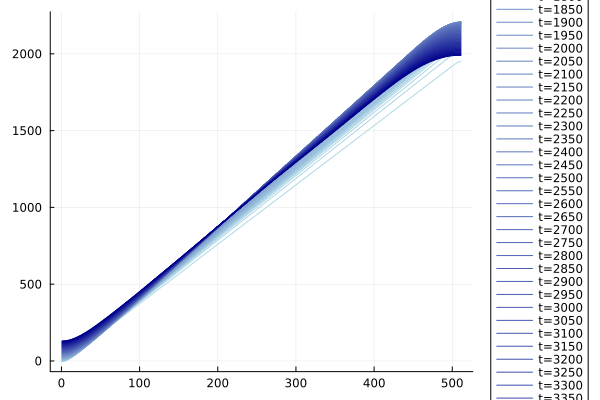

In [29]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 512
T = 10L

ts = 50:50:10L

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )
    ys = -t*log.(exp(1.35)*ys)
    plot!(plt, xs[1:end], ys[1:end], label="t=$t",legend=:outerright,color=colors[i])
end
plt

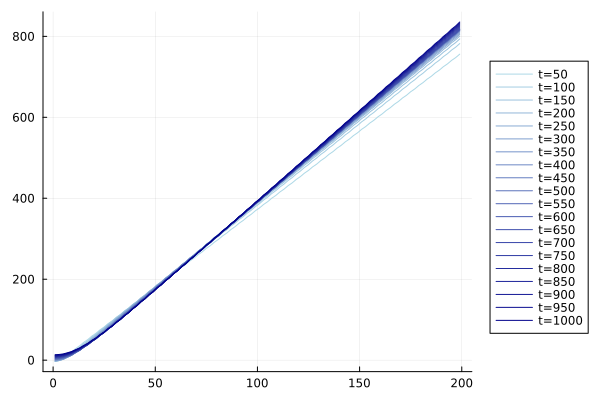

In [27]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 512
T = 10L

ts = 50:50:2L

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = 1:2:L
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )
    ys = -t*log.(exp(1.35)*ys)
    plot!(plt, xs[1:100], ys[1:100], label="t=$t",legend=:outerright,color=colors[i])
end
plt

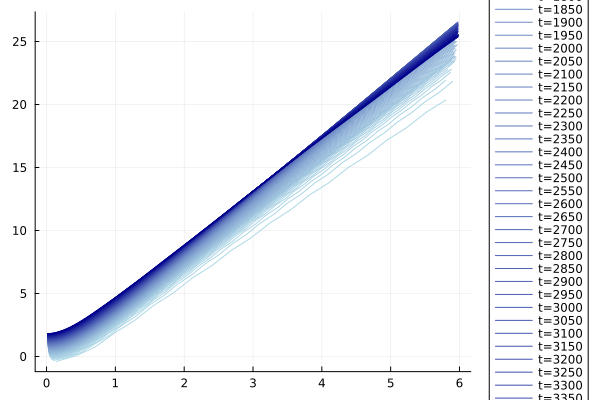

In [37]:
# which_ind(t) = t==0 ? 1 : t==1 ? 2 : t÷10+2
which_ind(t) = t÷10 + 1

p = 0.1

L = 512
T = 10L

ts = 50:50:10L

colors = palette(:blues, length(ts))
plt = plot()
for (i, t) in enumerate(ts)
    ind = which_ind(t)
    xs = collect(1:2:L)
    xs /= sqrt(t)
    ys = reverse(combined[(L=L, T=T, p=p, mode="renyi2", t=1)][:κ2_corrs][ind, :] )
    ys = -sqrt(t)*log.(exp(1.35)*ys)
    plot!(plt, xs[1:Int(floor(3sqrt(t)))], ys[1:Int(floor(3sqrt(t)))], label="t=$t",legend=:outerright,color=colors[i])
end
plt